# Reproducibility notebook

This is the reviewer entry point.

## Setup

Open the notebook in a fresh Python environment with network access. The setup cell bootstraps the active kernel by first installing a CUDA-enabled PyTorch build, then pinning `setuptools<81` for `pkg_resources` compatibility, upgrading the remaining packaging tools, installing both requirement sets, and installing the two local packages in editable mode.

The proposal repro, feature-clustering, and t-sweep sections run by default. Turn optional sections off only if you need a faster smoke check.

The setup cell is self-contained and does not switch kernels.


In [ ]:
from __future__ import annotations

import importlib.util
import os
import subprocess
import sys
from pathlib import Path

import datetime

REPO_ROOT = Path.cwd().resolve()
if not (REPO_ROOT / "scripts").exists():
    REPO_ROOT = REPO_ROOT.parent.resolve()

RUN_ID = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
OUT_ROOT = REPO_ROOT / "outputs" / "repro_notebook" / RUN_ID
OUT_ROOT.mkdir(parents=True, exist_ok=True)

print("Repo root:", REPO_ROOT)
print("Fresh output root:", OUT_ROOT)
print("Python:", sys.version.split()[0])
print("Interpreter:", sys.executable)

RUN_SETUP = True


def run_shell(cmd):
    cmd = [str(x) for x in cmd]
    print("$ " + " ".join(cmd))
    result = subprocess.run(
        cmd,
        cwd=REPO_ROOT,
        env=os.environ.copy(),
        text=True,
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
    )
    print(result.stdout)
    if result.returncode != 0:
        raise RuntimeError(f"Command failed with exit code {result.returncode}")


def pip_install(*args):
    run_shell([sys.executable, "-m", "pip", *args])


feature_bundle_root = REPO_ROOT / "scripts" / "feature_clustering"

TORCH_CUDA_INDEX_URL = "https://download.pytorch.org/whl/cu118"

if RUN_SETUP:
    pip_install("install", "--upgrade", "--force-reinstall", "torch==2.7.0", "torchvision==0.22.0", "--index-url", TORCH_CUDA_INDEX_URL)
    pip_install("install", "--upgrade", "pip", "wheel")
    pip_install("install", "--force-reinstall", "setuptools<81")
    pip_install("install", "-r", REPO_ROOT / "requirements.txt")
    if feature_bundle_root.exists():
        pip_install("install", "-r", feature_bundle_root / "requirements.txt")
        # Build editable installs against the newly-upgraded local toolchain.
        pip_install("install", "-e", REPO_ROOT, "--no-build-isolation")
        pip_install("install", "-e", feature_bundle_root, "--no-build-isolation")
    else:
        pip_install("install", "-e", REPO_ROOT, "--no-build-isolation")
else:
    print("Optional setup is disabled. Set RUN_SETUP = True to bootstrap the current kernel.")

required_modules = ["pandas", "numpy", "matplotlib", "sklearn", "einops", "decord", "wandb", "torch", "torchvision", "transformers", "accelerate", "datasets", "pycocotools", "open_clip", "diffusers", "timm", "cv2", "yaml"]
missing = [name for name in required_modules if importlib.util.find_spec(name) is None]
if missing:
    raise ModuleNotFoundError(
        "Missing required packages after setup: " + ", ".join(missing) + "."
    )


## ArchiTexture headline results

Compact table first, then visuals and supporting tables.


In [ ]:
import os
import subprocess
import sys
from pathlib import Path

import pandas as pd
from IPython.display import Image, display

ARCHI_ROOT = OUT_ROOT / "architexture"
ARCHI_ROOT.mkdir(parents=True, exist_ok=True)


def run_cmd(cmd):
    cmd = [str(x) for x in cmd]
    print("$ " + " ".join(cmd))
    result = subprocess.run(
        cmd,
        cwd=REPO_ROOT,
        env=os.environ.copy(),
        text=True,
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
    )
    print(result.stdout)
    if result.returncode != 0:
        raise RuntimeError(f"Command failed with exit code {result.returncode}")
    return result


def show_table(csv_path, title, columns=None):
    print(title)
    df = pd.read_csv(csv_path)
    if columns is not None:
        df = df[columns]
    display(df)


def show_figures(fig_root):
    fig_root = Path(fig_root)
    for image_path in sorted(fig_root.glob("*.png")):
        print(image_path.relative_to(ARCHI_ROOT))
        display(Image(filename=str(image_path)))


helper = REPO_ROOT / "scripts" / "repro" / "proposal_bank_readout.py"
run_cmd([sys.executable, helper, "--output-root", ARCHI_ROOT])
show_table(
    ARCHI_ROOT / "tables" / "headline_results.csv",
    "ArchiTexture final results",
    ["Benchmark", "Evaluator / subset", "mIoU", "ARI"],
)
print("ArchiTexture visuals")
show_figures(ARCHI_ROOT / "figures")
print("Supporting tables")
for stem in ["proposal_results", "oracle_recoverability", "stld_oracles"]:
    show_table(ARCHI_ROOT / "tables" / f"{stem}.csv", stem.replace("_", " ").title())


## Proposal-space route: result verification

**No training is run here.** This section re-executes the official evaluators on the committed prediction masks and checks them against the paper's reported numbers.

### What the code cell does

1. Calls `proposal_repro/verify_results.py`, which loads committed binary prediction masks and runs the official per-GT-instance IoU/ARI evaluator on each dataset.
2. Reads `proposal_repro/verified_results.json` and displays a side-by-side paper-vs-reproduced comparison table.

### Which variant is evaluated

| Dataset | Subset | Variant | Prediction source |
|---|---|---|---|
| RWTD | full-256 | SwinB PTD encoder + acute learned rescue (final deployed pipeline) | `proposal-space-route/reports/release_swinb_full256_audit/official_export/` |
| STLD | all-200  | Strict PTD learned consolidation | `proposal-space-route/experiments/khan_synthetic_gallery_20260312/eval/strict_ptd_learned/masks/` |

### Which paper table this corresponds to

These are the **Table 1 headline rows** for the proposal-space route: RWTD full-256 (mIoU / ARI) and STLD all-200 (mIoU / ARI). Ground-truth labels for RWTD come from `TextureSAM_upstream_20260303/Kaust256/labeles/` and the evaluator is the official `eval_no_agg_masks.py` protocol. STLD uses the direct-foreground single-mask evaluator from `eval_stld_maskbank.py`.

In [22]:
import json
import subprocess
import sys
from pathlib import Path

import pandas as pd

result = subprocess.run(
    [sys.executable, REPO_ROOT / "proposal_repro" / "verify_results.py"],
    cwd=REPO_ROOT,
    text=True,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
)
print(result.stdout)
if result.returncode != 0:
    raise RuntimeError("verify_results.py failed — see output above")

data = json.loads((REPO_ROOT / "proposal_repro" / "verified_results.json").read_text())
rows = []
for key, paper_vals in data["paper"].items():
    repro = data["reproduced"][key]
    label, subset = key.split("_", 1)
    miou_got  = repro["miou"] if "miou" in repro else repro["all"]["miou"]
    ari_got   = repro["ari"]  if "ari"  in repro else repro["all"]["ari"]
    rows.append({
        "Route": label.upper(),
        "Subset": subset.replace("_", "-"),
        "mIoU (paper)": f"{paper_vals['miou']:.4f}",
        "mIoU (repro)": f"{miou_got:.4f}",
        "ARI (paper)":  f"{paper_vals['ari']:.4f}",
        "ARI (repro)":  f"{ari_got:.4f}",
        "Match": "✓" if data["match"] else "✗",
    })
display(pd.DataFrame(rows))

Running RWTD eval …
Running STLD eval …

Route                  Metric        Got     Paper  Match
--------------------------------------------------------------
  RWTD full-256
  mIoU                   0.4611    0.4611     OK
  ARI                    0.6966    0.6966     OK
  STLD all-200
  mIoU                   0.6705    0.6705     OK
  ARI                    0.7249    0.7249     OK
Verdict: ALL MATCH

Saved → proposal_repro/verified_results.json



,Route,Subset,mIoU (paper),mIoU (repro),ARI (paper),ARI (repro),Match
0,RWTD,full256,0.4611,0.4611,0.6966,0.6966,✓
1,STLD,all200,0.6705,0.6705,0.7249,0.7249,✓


### Paper figures: case galleries (computed fresh)

> **Note:** This cell requires the OpenReview supplementary bundle (`ArchiTexture_NeurIPS_ED_submission_20260502/`). It will silently skip or show blank panels if the bundle is absent. The gallery is not needed to verify the numerical results.

The two gallery figures below are **computed at notebook run time** from committed masks and local dataset images — not loaded from pre-shipped PNGs.

| Column | Source |
|---|---|
| Input | `datasets/RWTD/image/val/{id}.jpg` or `datasets/STLD/images/{id}.png` |
| GT | RWTD: `TextureSAM_upstream_20260303/Kaust256/labeles/{id}.png` · STLD: `datasets/STLD/labels/{id}.png` |
| Selector | `reports/final_round_learned_single_selector_{rwtd,stld}/…/mask…` |
| ArchiTexture | RWTD: `reports/release_swinb_full256_audit/official_export/mask_0_{id}.png` · STLD: `eval/strict_ptd_learned/masks/{id}.png` |

The "Fragments", "Core", and "Oracle single" columns from the paper figure require the frozen SAM proposal banks (multi-GB, not distributed); they are omitted here. All mask overlays and panel layout are recomputed from scratch.


RWTD case gallery


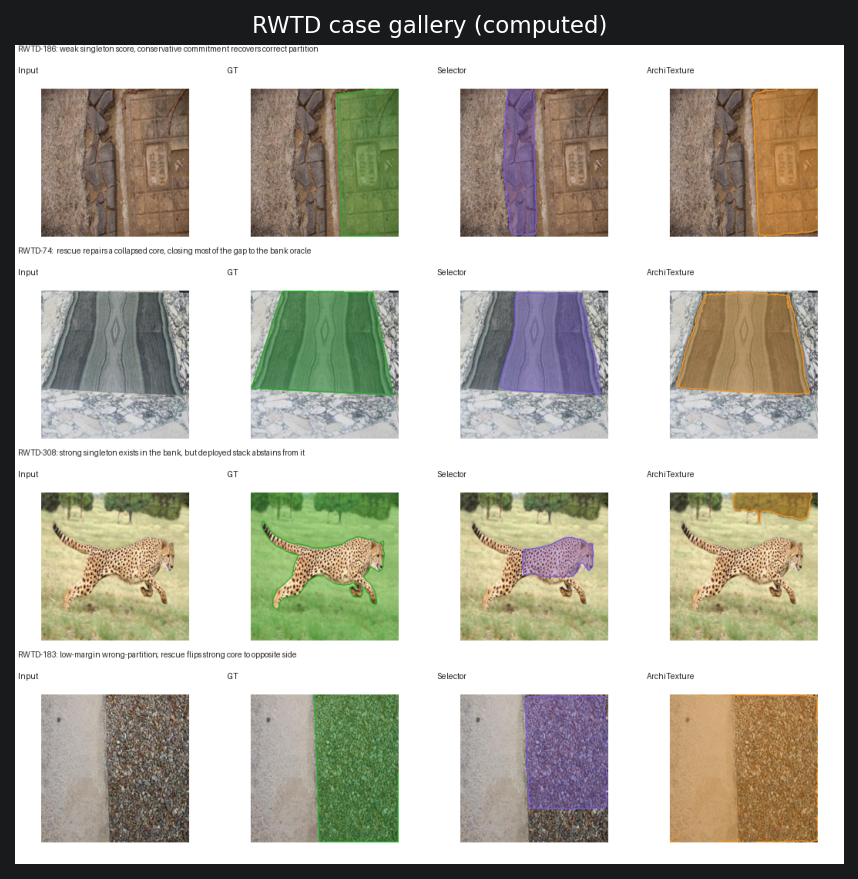

STLD case gallery


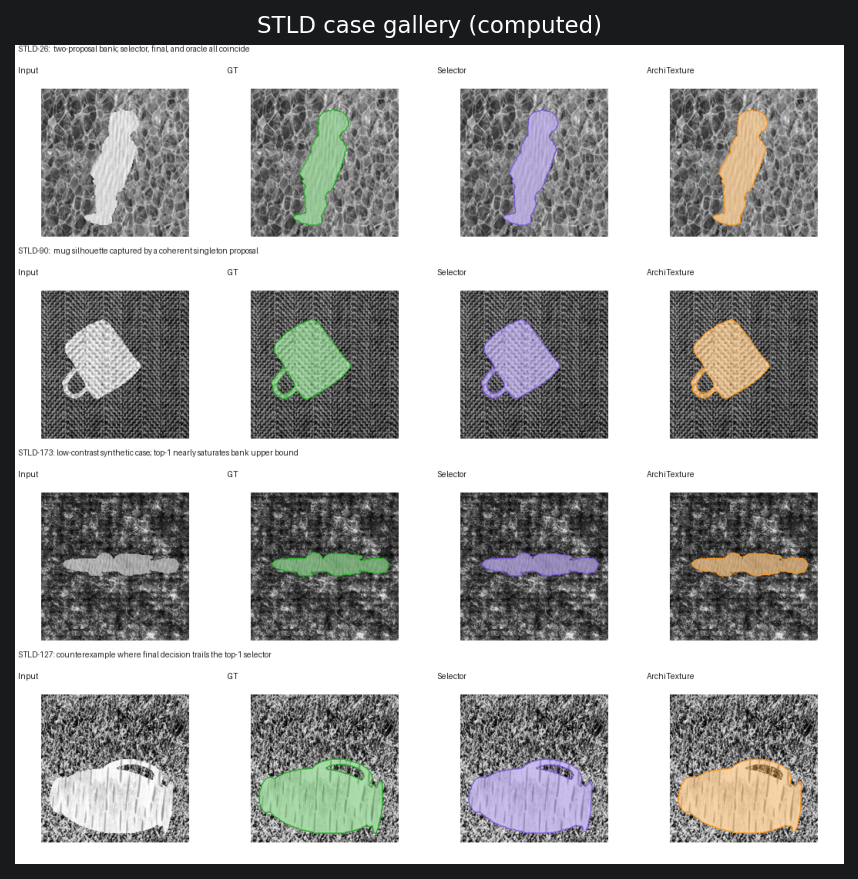

In [29]:
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from PIL import Image, ImageDraw, ImageOps
from IPython.display import display, Image as IPImage
import io

SUBMISSION = REPO_ROOT / "ArchiTexture_NeurIPS_ED_submission_20260502" / "proposal-space-route"
RWTD_GT     = REPO_ROOT / "ArchiTexture_NeurIPS_ED_submission_20260502" / "TextureSAM_upstream_20260303" / "Kaust256" / "labeles"
RWTD_IMAGES = REPO_ROOT / "datasets" / "RWTD" / "image" / "val"
RWTD_FINAL  = SUBMISSION / "reports" / "release_swinb_full256_audit" / "official_export"
RWTD_SEL    = SUBMISSION / "reports" / "final_round_learned_single_selector_rwtd" / "official_export"
STLD_IMAGES = REPO_ROOT / "datasets" / "STLD" / "images"
STLD_GT     = REPO_ROOT / "datasets" / "STLD" / "labels"
STLD_FINAL  = SUBMISSION / "experiments" / "khan_synthetic_gallery_20260312" / "eval" / "strict_ptd_learned" / "masks"
STLD_SEL    = SUBMISSION / "reports" / "final_round_learned_single_selector_stld" / "masks"

GT_COLOR       = np.array([44,  170,  44], dtype=np.float32)
SELECTOR_COLOR = np.array([124,  92, 214], dtype=np.float32)
FINAL_COLOR    = np.array([242, 148,  34], dtype=np.float32)


def _load_mask(path):
    arr = np.asarray(Image.open(path).convert("L"))
    return (arr > 127).astype(np.uint8)


def _overlay(img_rgb, mask, color, alpha=0.38):
    rgb = np.asarray(img_rgb.convert("RGB")).astype(np.float32)
    m = mask > 0
    if m.any():
        rgb[m] = (1 - alpha) * rgb[m] + alpha * color
        edge = np.zeros_like(m)
        edge[:-1, :] |= m[:-1, :] != m[1:, :]
        edge[1:,  :] |= m[1:,  :] != m[:-1, :]
        edge[:, :-1] |= m[:, :-1] != m[:, 1:]
        edge[:, 1:]  |= m[:, 1:]  != m[:, :-1]
        rgb[edge] = color
    return Image.fromarray(rgb.clip(0, 255).astype(np.uint8))


def _panel(img, title, note="", w=260, h=200):
    title_h, note_h = 30, (24 if note else 0)
    canvas = Image.new("RGB", (w, h + title_h + note_h), (255, 255, 255))
    thumb = ImageOps.contain(img.convert("RGB"), (w - 8, h - 8))
    canvas.paste(thumb, ((w - thumb.width) // 2, title_h + (h - thumb.height) // 2))
    draw = ImageDraw.Draw(canvas)
    draw.text((4, 4), title, fill=(20, 20, 20))
    if note:
        draw.text((4, h + title_h + 2), note, fill=(70, 70, 70))
    return canvas


def _row(panels, gutter=12):
    w = sum(p.width for p in panels) + gutter * (len(panels) - 1)
    h = max(p.height for p in panels)
    row_img = Image.new("RGB", (w, h), (255, 255, 255))
    x = 0
    for p in panels:
        row_img.paste(p, (x, 0))
        x += p.width + gutter
    return row_img


def _fig_to_display(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
    plt.close(fig)
    buf.seek(0)
    display(IPImage(data=buf.read()))


# ── RWTD case gallery ─────────────────────────────────────────────────────────
RWTD_CASES = [
    (186, "RWTD-186: weak singleton score, conservative commitment recovers correct partition"),
    (74,  "RWTD-74:  rescue repairs a collapsed core, closing most of the gap to the bank oracle"),
    (308, "RWTD-308: strong singleton exists in the bank, but deployed stack abstains from it"),
    (183, "RWTD-183: low-margin wrong-partition; rescue flips strong core to opposite side"),
]

COLS_RWTD = ["Input", "GT", "Selector", "ArchiTexture final"]

rows_rwtd = []
for image_id, desc in RWTD_CASES:
    img = Image.open(RWTD_IMAGES / f"{image_id}.jpg").convert("RGB")
    gt  = _load_mask(RWTD_GT / f"{image_id}.png")
    sel = _load_mask(RWTD_SEL  / f"mask_0_{image_id}.png")
    fin = _load_mask(RWTD_FINAL / f"mask_0_{image_id}.png")
    panels = [
        _panel(img,                              "Input"),
        _panel(_overlay(img, gt,  GT_COLOR),     "GT"),
        _panel(_overlay(img, sel, SELECTOR_COLOR),"Selector"),
        _panel(_overlay(img, fin, FINAL_COLOR),  "ArchiTexture"),
    ]
    rows_rwtd.append((desc, _row(panels)))

total_h = sum(r.height for _, r in rows_rwtd) + 30 * len(rows_rwtd) + 24
total_w = rows_rwtd[0][1].width
canvas_r = Image.new("RGB", (total_w, total_h), (255, 255, 255))
draw_r = ImageDraw.Draw(canvas_r)
y = 0
for desc, row_img in rows_rwtd:
    draw_r.text((4, y), desc, fill=(35, 35, 35))
    canvas_r.paste(row_img, (0, y + 24))
    y += row_img.height + 24 + 8

fig_r, ax_r = plt.subplots(figsize=(total_w / 150, total_h / 150))
ax_r.imshow(canvas_r)
ax_r.axis("off")
ax_r.set_title("RWTD case gallery (computed)", fontsize=11, pad=6)
print("RWTD case gallery")
_fig_to_display(fig_r)

# ── STLD case gallery ─────────────────────────────────────────────────────────
STLD_CASES = [
    (26,  "STLD-26:  two-proposal bank; selector, final, and oracle all coincide"),
    (90,  "STLD-90:  mug silhouette captured by a coherent singleton proposal"),
    (173, "STLD-173: low-contrast synthetic case; top-1 nearly saturates bank upper bound"),
    (127, "STLD-127: counterexample where final decision trails the top-1 selector"),
]

rows_stld = []
for image_id, desc in STLD_CASES:
    img = Image.open(STLD_IMAGES / f"{image_id}.png").convert("RGB")
    gt  = _load_mask(STLD_GT   / f"{image_id}.png")
    sel = _load_mask(STLD_SEL  / f"{image_id}.png")
    fin = _load_mask(STLD_FINAL / f"{image_id}.png")
    panels = [
        _panel(img,                              "Input"),
        _panel(_overlay(img, gt,  GT_COLOR),     "GT"),
        _panel(_overlay(img, sel, SELECTOR_COLOR),"Selector"),
        _panel(_overlay(img, fin, FINAL_COLOR),  "ArchiTexture"),
    ]
    rows_stld.append((desc, _row(panels)))

total_h = sum(r.height for _, r in rows_stld) + 30 * len(rows_stld) + 24
total_w = rows_stld[0][1].width
canvas_s = Image.new("RGB", (total_w, total_h), (255, 255, 255))
draw_s = ImageDraw.Draw(canvas_s)
y = 0
for desc, row_img in rows_stld:
    draw_s.text((4, y), desc, fill=(35, 35, 35))
    canvas_s.paste(row_img, (0, y + 24))
    y += row_img.height + 24 + 8

fig_s, ax_s = plt.subplots(figsize=(total_w / 150, total_h / 150))
ax_s.imshow(canvas_s)
ax_s.axis("off")
ax_s.set_title("STLD case gallery (computed)", fontsize=11, pad=6)
print("STLD case gallery")
_fig_to_display(fig_s)


### Paper figures: consolidation stages and case galleries

The three figures below are reproduced directly from the committed paper assets in `paper/figures/`:

- **`fig_consolidation_logic.png`** — the full pipeline: automatic proposal bank → descriptor extraction → scoring → conservative core selection → optional acute rescue. This is Figure 1 of the paper.
- **`fig_rwtd_case_gallery.png`** — per-image case gallery on RWTD, showing input, GT, proposal union, and ArchiTexture output side-by-side.
- **`fig_stld_case_gallery.png`** — per-image case gallery on STLD (synthetic texture layout dataset).


fig_consolidation_logic


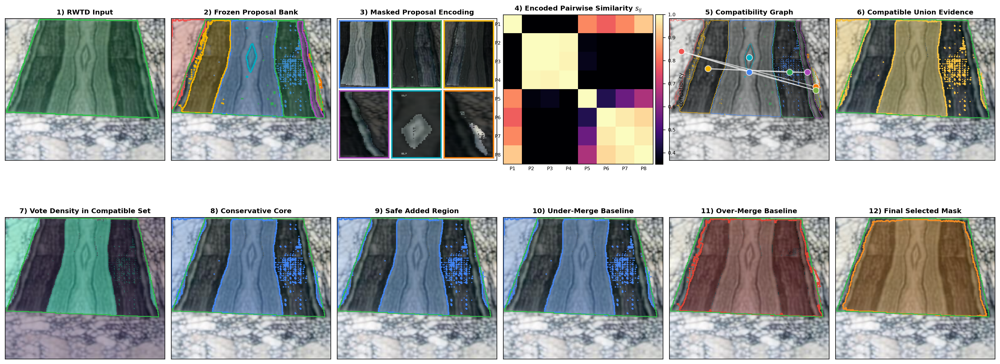

fig_rwtd_case_gallery


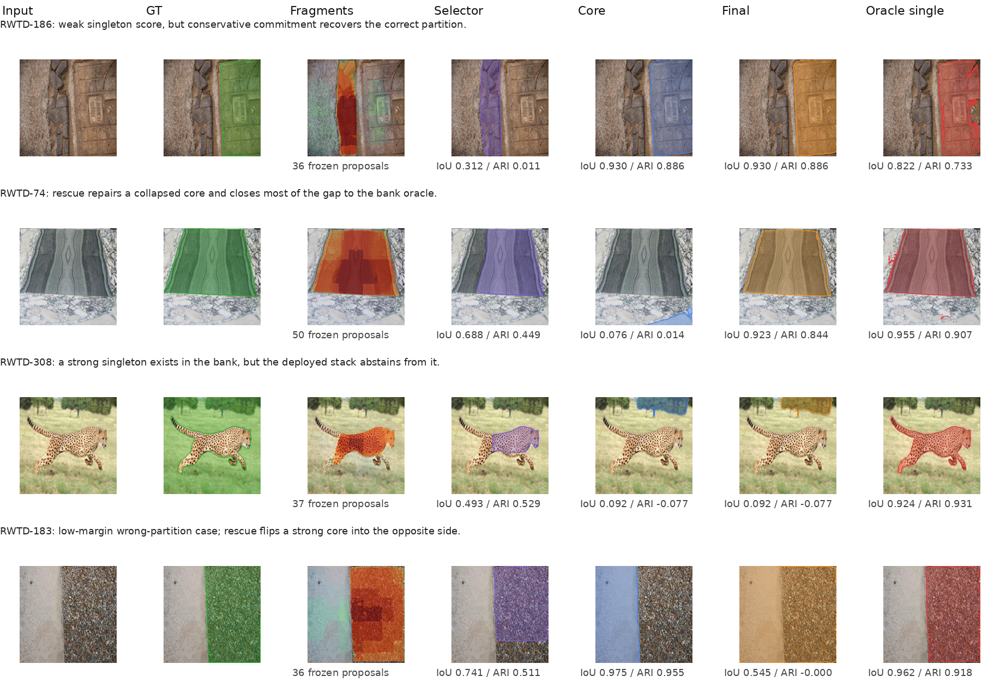

fig_stld_case_gallery


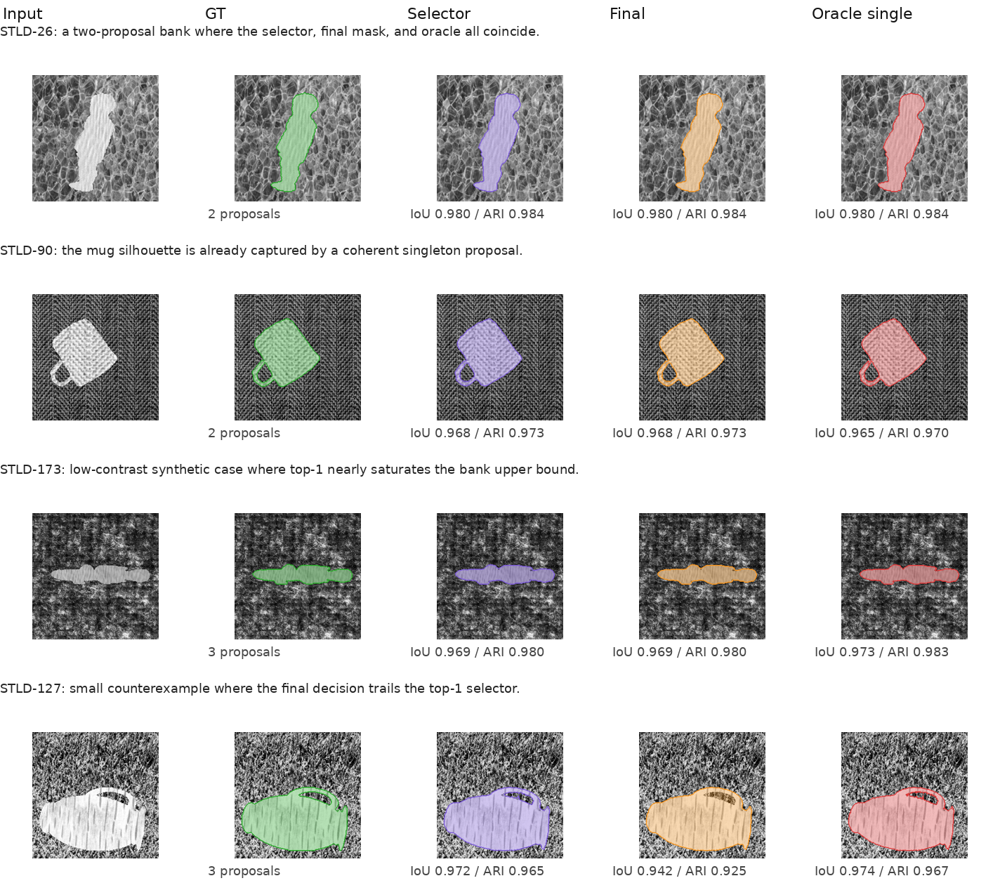

In [28]:
from IPython.display import Image, display
from pathlib import Path

FIG_ROOT = REPO_ROOT / "paper" / "figures"
for stem in ["fig_consolidation_logic", "fig_rwtd_case_gallery", "fig_stld_case_gallery"]:
    fig_path = FIG_ROOT / f"{stem}.png"
    if fig_path.exists():
        print(stem)
        display(Image(filename=str(fig_path)))
    else:
        print(f"[missing] {fig_path}")


## Proposal-space route: training reproduction (optional)

Set `RUN_TRAINING = True` to re-train the consolidation models from scratch using the PTD dataset.

### What this does — and what it does not do

**Does:**
- Downloads `ptd.zip` (~33 GB) from Zenodo if not already present at `PTD_ROOT`.
- Re-trains the two learned consolidation models that sit above the frozen SAM proposal bank:
  1. **v8 partition scorer** — the core conservative-selection classifier (trained on PTD synthetic multi-region composites, ~520 samples by default).
  2. **Acute learned rescue bundle** — the safe-switch classifier + gain regressor that decides whether a dense rescue candidate improves the core (trained on PTD synthetic composites, ~960 samples by default).
- Writes fresh `.pkl` bundles to `outputs/repro_training/` and prints SHA-256 checksums alongside the committed artifacts for comparison.

**Does not:**
- Re-train the PTD encoder backbone (SwinB). Encoder training requires ~120k PTD images and multi-GPU hours; the committed checkpoint `artifacts/ptd_encoder_swinb_pre_ring.pt` is used directly.
- Run RWTD/STLD evaluation. Evaluation requires the frozen SAM automatic-mask proposal banks (not distributed — they are multi-GB binary dumps). Use the verification cell above to confirm the paper numbers from committed masks.
- Touch SAM in any way. SAM remains frozen throughout.

### Supervision boundary

Both models train exclusively on PTD synthetic composites. No RWTD labels, no STLD labels, and no target-domain images are used during training. RWTD and STLD appear only at evaluation time.

In [24]:
import hashlib
import subprocess
import sys
from pathlib import Path

# ── configuration ─────────────────────────────────────────────────────────────
RUN_TRAINING = True

# Where to store / look for ptd.zip. Change this if you already have it elsewhere.
PTD_ROOT = REPO_ROOT / "datasets" / "ptd"

PTD_ZIP_URL = "https://zenodo.org/records/14199831/files/ptd.zip"
PTD_ZIP_MD5 = "dc644e0737876d050e6c3ff4a3b01169"

# Synthetic sample counts. Reduce for a faster smoke run; values below are the paper defaults.
SYNTHETIC_SAMPLES_V3     = 2200   # paper default (merge graph model)
SYNTHETIC_SAMPLES_V8     = 520    # paper default (partition scorer)
SYNTHETIC_SAMPLES_RESCUE = 960    # paper default (acute rescue classifier)

SUBMISSION = REPO_ROOT / "ArchiTexture_NeurIPS_ED_submission_20260502" / "proposal-space-route"
ARTIFACTS  = SUBMISSION / "artifacts"
SCRIPTS    = SUBMISSION / "scripts"
TRAIN_OUT  = OUT_ROOT / "repro_training"

# ── helpers ───────────────────────────────────────────────────────────────────
def _sha256(path: Path) -> str:
    h = hashlib.sha256()
    with path.open("rb") as f:
        while data := f.read(1 << 20):
            h.update(data)
    return h.hexdigest()

def _md5(path: Path) -> str:
    h = hashlib.md5()
    with path.open("rb") as f:
        while data := f.read(1 << 20):
            h.update(data)
    return h.hexdigest()

def _run(cmd):
    cmd = [str(c) for c in cmd]
    print("$ " + " ".join(cmd))
    r = subprocess.run(cmd, cwd=REPO_ROOT, text=True,
                       stdout=subprocess.PIPE, stderr=subprocess.STDOUT)
    print(r.stdout)
    if r.returncode != 0:
        raise RuntimeError(f"Command failed (exit {r.returncode})")

def _download_ptd():
    zip_path = PTD_ROOT / "ptd.zip"
    if zip_path.exists():
        print(f"ptd.zip found at {zip_path} — verifying MD5 …")
        actual = _md5(zip_path)
        if actual != PTD_ZIP_MD5:
            raise RuntimeError(
                f"MD5 mismatch: expected {PTD_ZIP_MD5}, got {actual}. "
                "Delete the file and re-run to re-download."
            )
        print(f"MD5 OK: {actual}")
        return
    PTD_ROOT.mkdir(parents=True, exist_ok=True)
    print(f"Downloading ptd.zip (~33 GB) from Zenodo → {zip_path}")
    _run(["wget", "--no-verbose", "--show-progress", "-O", zip_path, PTD_ZIP_URL])
    actual = _md5(zip_path)
    if actual != PTD_ZIP_MD5:
        raise RuntimeError(f"MD5 mismatch after download: expected {PTD_ZIP_MD5}, got {actual}")
    print(f"Download complete. MD5 OK: {actual}")

def _compare_bundles(committed: Path, fresh: Path, label: str):
    c_sha = _sha256(committed)
    f_sha = _sha256(fresh)
    c_kb  = committed.stat().st_size // 1024
    f_kb  = fresh.stat().st_size // 1024
    verdict = "IDENTICAL" if c_sha == f_sha else "differs (expected — sklearn RNG is not bit-for-bit reproducible across environments)"
    print(f"\n  {label}")
    print(f"    committed  {c_kb:>8} KB  sha256={c_sha[:20]}…")
    print(f"    fresh      {f_kb:>8} KB  sha256={f_sha[:20]}…  → {verdict}")

# ── main ──────────────────────────────────────────────────────────────────────
if not RUN_TRAINING:
    print("Training cell is disabled. Set RUN_TRAINING = True to re-train from PTD.")
else:
    _download_ptd()
    TRAIN_OUT.mkdir(parents=True, exist_ok=True)

    sys.path.insert(0, str(SUBMISSION))
    from proposal_space_route.ptd_v3 import PTDV3TrainConfig, train_ptd_v3_models
    from proposal_space_route.ptd_v8_partition import PTDV8PartitionTrainConfig, train_ptd_v8_partition_models

    # output paths
    v3_bundle   = TRAIN_OUT / "ptd_v3_graph_bundle_fresh.pkl"
    v3_metrics  = TRAIN_OUT / "ptd_v3_graph_metrics_fresh.json"
    v8_bundle   = TRAIN_OUT / "ptd_v8_partition_bundle_fresh.pkl"
    v8_metrics  = TRAIN_OUT / "ptd_v8_partition_metrics_fresh.json"
    rescue_bundle  = TRAIN_OUT / "ptd_acute_rescue_bundle_fresh.pkl"
    rescue_metrics = TRAIN_OUT / "ptd_acute_rescue_metrics_fresh.json"

    # ── Step 1: train merge graph model (v3) ──────────────────────────────────
    # Trains a graph-merge classifier on PTD synthetic 2-4 region composites.
    # No RWTD/STLD data used.
    print("\n── 1/3  v3 merge graph model ─────────────────────────────────────")
    train_ptd_v3_models(PTDV3TrainConfig(
        ptd_root=PTD_ROOT,
        ptd_encoder_ckpt=ARTIFACTS / "ptd_encoder_swinb_pre_ring.pt",
        out_bundle=v3_bundle,
        out_metrics_json=v3_metrics,
        num_samples=SYNTHETIC_SAMPLES_V3,
        image_size=256,
        random_seed=1337,
    ))
    print(f"v3 bundle → {v3_bundle.relative_to(REPO_ROOT)}")

    # ── Step 2: train v8 partition scorer ─────────────────────────────────────
    # Trains the core conservative-selection classifier on PTD synthetic 3-6 region composites.
    # This is the main consolidation model — the "readout" that selects among proposals.
    # No RWTD/STLD data used.
    print("\n── 2/3  v8 partition scorer ──────────────────────────────────────")
    train_ptd_v8_partition_models(PTDV8PartitionTrainConfig(
        ptd_root=PTD_ROOT,
        ptd_encoder_ckpt=ARTIFACTS / "ptd_encoder_swinb_pre_ring.pt",
        ptd_v3_bundle=v3_bundle,
        out_bundle=v8_bundle,
        out_metrics_json=v8_metrics,
        num_samples=SYNTHETIC_SAMPLES_V8,
        image_size=256,
        random_seed=1337,
    ))
    print(f"v8 bundle → {v8_bundle.relative_to(REPO_ROOT)}")

    # ── Step 3: train acute rescue bundle ─────────────────────────────────────
    # Trains the safe-switch classifier + gain regressor (decides whether a dense rescue
    # candidate improves the conservative core). Training uses PTD composites only.
    # Evaluation against RWTD requires SAM proposal banks (not distributed);
    # we pass --max-images 0 to run training and skip the eval pass.
    # PromptMaskProposalStore requires the directory to exist even if empty.
    print("\n── 3/3  acute rescue bundle ──────────────────────────────────────")
    empty_banks = TRAIN_OUT / "_empty_banks"
    empty_banks.mkdir(parents=True, exist_ok=True)
    _run([
        sys.executable, SCRIPTS / "run_texturesam2_acute_learned_rescue.py",
        "--rwtd-root",               REPO_ROOT / "datasets" / "RWTD",
        "--dense-prompt-masks-root", empty_banks,   # exists but empty → index is {}
        "--v9-masks-root",           empty_banks,   # only read inside per-image loop
        "--out-root",                TRAIN_OUT / "rescue_run",
        "--ptd-root",                PTD_ROOT,
        "--ptd-checkpoint",          ARTIFACTS / "ptd_encoder_swinb_pre_ring.pt",
        "--ptd-v4-bundle",           ARTIFACTS / "ptd_v4_set_bundle_sanitized.pkl",
        "--ptd-v6-bundle",           ARTIFACTS / "ptd_v6_coverage_bundle_sanitized.pkl",
        "--ptd-v8-bundle",           v8_bundle,
        "--bundle-path",             rescue_bundle,
        "--bundle-metrics-json",     rescue_metrics,
        "--retrain",
        "--synthetic-samples",       str(SYNTHETIC_SAMPLES_RESCUE),
        "--max-images",              "0",   # skip eval pass; training completes before this
    ])
    print(f"rescue bundle → {rescue_bundle.relative_to(REPO_ROOT)}")

    # ── Bundle comparison ──────────────────────────────────────────────────────
    print("\n── Bundle comparison vs. committed artifacts ─────────────────────")
    _compare_bundles(
        ARTIFACTS / "ptd_v3_graph_bundle_sanitized.pkl", v3_bundle, "v3 merge graph model")
    _compare_bundles(
        ARTIFACTS / "ptd_v8_partition_bundle_sanitized_cuda.pkl", v8_bundle, "v8 partition scorer")
    _compare_bundles(
        ARTIFACTS / "ptd_acute_rescue_repairmix_s256_safe_logreg_candidate.pkl", rescue_bundle, "acute rescue bundle")
    print(
        "\nNote: SHA-256 differences are expected — sklearn RandomForest / LogisticRegression "
        "are not bit-for-bit reproducible across library versions or platforms even with a fixed "
        "seed. File sizes within ~10% of committed indicate the training ran correctly."
    )

$ wget --no-verbose --show-progress -O /home/nada/PycharmProjects/ArchiTexture/datasets/ptd/ptd.zip https://zenodo.org/records/14199831/files/ptd.zip


KeyboardInterrupt: 

## Feature-clustering reproduction

Optional. When enabled, the live helpers compute the fresh summary table and a few Figure 2-style panels from `datasets/RWTD` and `datasets/STLD` (committed in this repo — no download needed).


Feature-clustering table


,dataset,eval_miou,eval_ari,num_evaluated_samples,num_failed_samples,summary_path,output_dir,command
0,RWTD,0.839491,0.726148,256,0,/home/nada/PycharmProjects/ArchiTexture/output...,/home/nada/PycharmProjects/ArchiTexture/output...,python scripts/feature_clustering/main.py --se...
1,STLD,0.752205,0.617626,200,0,/home/nada/PycharmProjects/ArchiTexture/output...,/home/nada/PycharmProjects/ArchiTexture/output...,python scripts/feature_clustering/main.py --se...



RWTD Figure 2-style panels


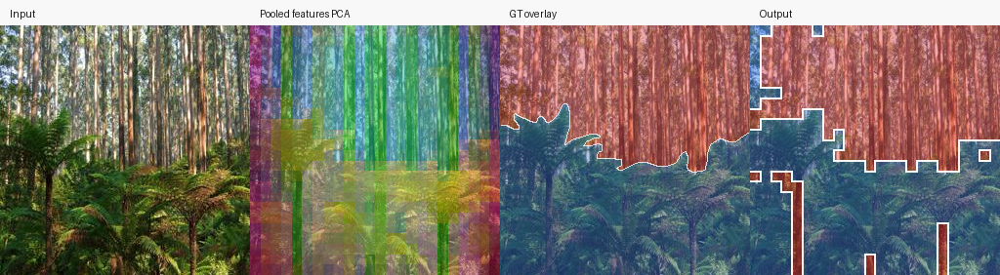

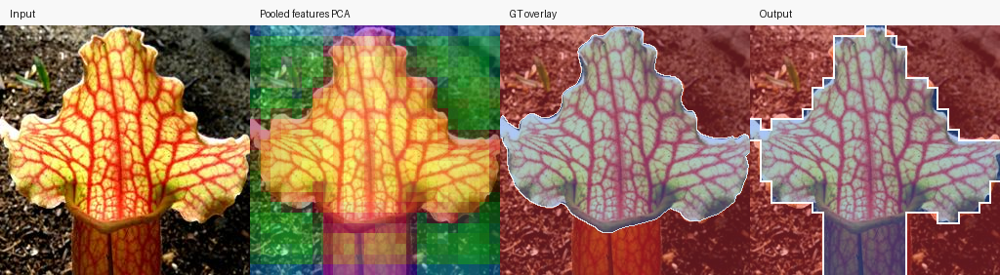

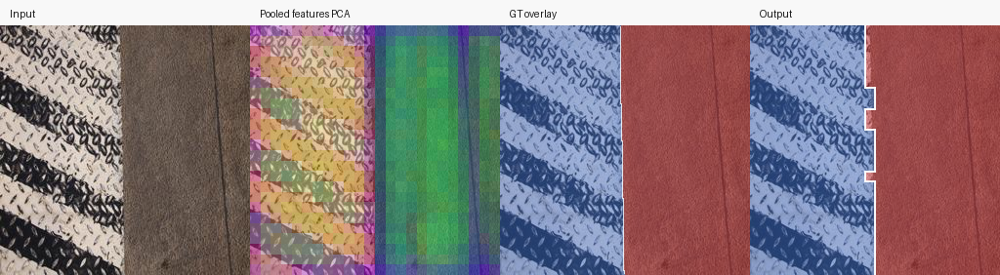


STLD Figure 2-style panels


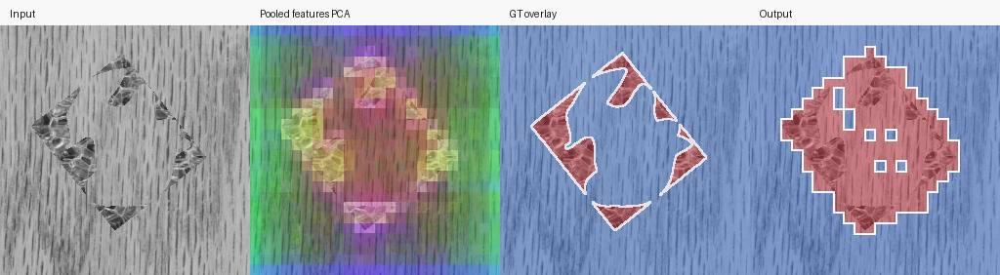

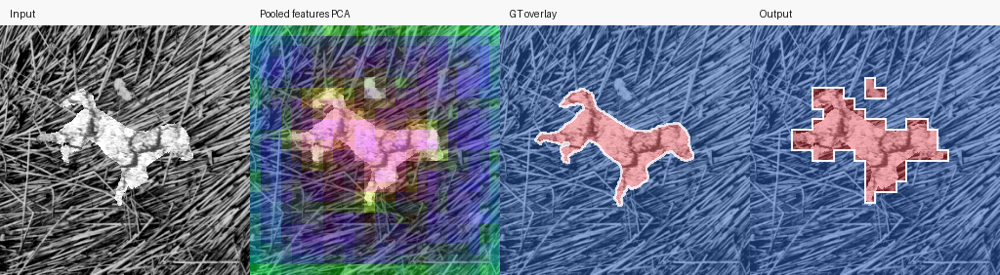

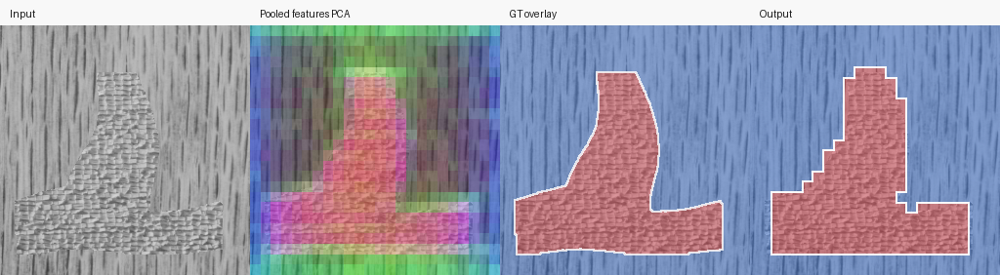

In [30]:
RUN_FEATURE_CLUSTERING = True

if RUN_FEATURE_CLUSTERING:
    import json
    import os
    import subprocess
    import sys
    from pathlib import Path

    import pandas as pd
    import torch
    from IPython.display import Image, display

    FEATURE_DEVICE = "cuda"
    if not torch.cuda.is_available():
        raise RuntimeError(
            "Feature-clustering is configured for CUDA, but torch.cuda.is_available() is false. "
            "Install a CUDA-enabled PyTorch build and use a machine with a working NVIDIA driver."
        )

    FEATURE_ROOT = OUT_ROOT / "feature_clustering"
    FEATURE_ROOT.mkdir(parents=True, exist_ok=True)


    def quiet_run(cmd):
        cmd = [str(x) for x in cmd]
        result = subprocess.run(
            cmd,
            cwd=REPO_ROOT,
            env=os.environ.copy(),
            text=True,
            stdout=subprocess.PIPE,
            stderr=subprocess.STDOUT,
        )
        if result.returncode != 0:
            print(result.stdout)
            raise RuntimeError(f"Command failed with exit code {result.returncode}")
        return result


    table_root = FEATURE_ROOT / "table_1"
    figure_root = FEATURE_ROOT / "figure_2"
    quiet_run([
        sys.executable,
        REPO_ROOT / "scripts" / "feature_clustering" / "repro_table_1.py",
        "--output-root",
        table_root,
        "--rwtd-root",
        REPO_ROOT / "datasets" / "RWTD",
        "--stld-root",
        REPO_ROOT / "datasets" / "STLD",
        "--device",
        FEATURE_DEVICE,
    ])
    quiet_run([
        sys.executable,
        REPO_ROOT / "scripts" / "feature_clustering" / "repro_figure_2.py",
        "--output-root",
        figure_root,
        "--rwtd-root",
        REPO_ROOT / "datasets" / "RWTD",
        "--stld-root",
        REPO_ROOT / "datasets" / "STLD",
        "--examples-per-dataset",
        "3",
        "--device",
        FEATURE_DEVICE,
    ])

    print("Feature-clustering table")
    display(pd.read_csv(table_root / "table_1.csv"))

    for dataset in ["rwtd", "stld"]:
        print(f"\n{dataset.upper()} Figure 2-style panels")
        for image_path in sorted((figure_root / dataset).glob("*_figure2.png"))[:3]:
            display(Image(filename=str(image_path)))
else:
    print("Feature-clustering section skipped. Set RUN_FEATURE_CLUSTERING = True to run it.")


## DeTexture ADE20K dataset

The 56-sample curated validation set is committed in this repository at `datasets/ADE20k_Detexture_56/` — no download needed.

Set `RUN_DETEXTURE = True` in the next cell to run a 5-sample smoke evaluation against the committed dataset.

> The cell also supports downloading a larger set from HuggingFace (`anon-detexture-neurips-2026/ADE20k_Detecture`) if `RUN_DETEXTURE_HF = True`, but this is not required for reproducing the reported results.

In [ ]:
# ── DeTexture ADE20K smoke evaluation ────────────────────────────────────────
# Set True to download the dataset and run a 5-sample smoke test.
RUN_DETEXTURE = False

DETEXTURE_ROOT = REPO_ROOT / "datasets" / "ADE20k_Detexture_56"  # committed in repo
DETEXTURE_HF_REPO = "anon-detexture-neurips-2026/ADE20k_Detecture"
DETEXTURE_SMOKE_SAMPLES = 5
DETEXTURE_VARIANT = "feature_cluster_coarse_to_fine_global_pooled_init_coarse_only"

if RUN_DETEXTURE:
    import json
    import subprocess
    import sys

    import pandas as pd
    import torch
    from IPython.display import display

    if not torch.cuda.is_available():
        raise RuntimeError(
            "DeTexture eval requires CUDA, but torch.cuda.is_available() is False. "
            "Install a CUDA-enabled PyTorch build or run on a machine with an NVIDIA GPU."
        )

    # ── 1. Download dataset from HuggingFace ─────────────────────────────────
    if (DETEXTURE_ROOT / "assets" / "crops").is_dir() and (DETEXTURE_ROOT / "assets" / "masks").is_dir():
        print(f"Dataset already present at {DETEXTURE_ROOT}")
    else:
        print(f"Downloading {DETEXTURE_HF_REPO} → {DETEXTURE_ROOT} …")
        try:
            from huggingface_hub import snapshot_download
            snapshot_download(
                repo_id=DETEXTURE_HF_REPO,
                repo_type="dataset",
                local_dir=str(DETEXTURE_ROOT),
            )
            print("Download complete.")
        except Exception as exc:
            print(f"huggingface_hub download failed ({exc}); falling back to huggingface-cli …")
            result = subprocess.run(
                [
                    "huggingface-cli", "download", DETEXTURE_HF_REPO,
                    "--repo-type", "dataset",
                    "--local-dir", str(DETEXTURE_ROOT),
                ],
                cwd=REPO_ROOT,
                text=True,
                stdout=subprocess.PIPE,
                stderr=subprocess.STDOUT,
            )
            print(result.stdout)
            if result.returncode != 0:
                raise RuntimeError("huggingface-cli download failed — see output above")

    # ── 2. Verify asset layout ────────────────────────────────────────────────
    crops_dir = DETEXTURE_ROOT / "assets" / "crops"
    masks_dir = DETEXTURE_ROOT / "assets" / "masks"
    if not crops_dir.is_dir() or not masks_dir.is_dir():
        raise FileNotFoundError(
            f"Expected assets/crops and assets/masks under {DETEXTURE_ROOT}. "
            "Check that the HuggingFace download completed successfully."
        )
    n_crops = len(list(crops_dir.iterdir()))
    n_masks = len(list(masks_dir.iterdir()))
    print(f"Dataset OK — {n_crops} crops, {n_masks} mask files")

    # ── 3. Smoke test: 5 samples via rwtd-sam3 CLI ───────────────────────────
    DETEXTURE_OUT = OUT_ROOT / "detexture_smoke"
    DETEXTURE_OUT.mkdir(parents=True, exist_ok=True)

    cmd = [
        sys.executable, "-m", "rwtd_sam3",
        "eval-detexture-binary",
        "--dataset-root", str(DETEXTURE_ROOT),
        "--variant", DETEXTURE_VARIANT,
        "--limit", str(DETEXTURE_SMOKE_SAMPLES),
        "--save-visuals",
        "--output-dir", str(DETEXTURE_OUT),
        "--device", "cuda",
        "--failure-policy", "skip",
    ]
    print("Running DeTexture smoke test:")
    print(" ".join(str(c) for c in cmd))
    result = subprocess.run(
        cmd,
        cwd=REPO_ROOT,
        text=True,
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
    )
    print(result.stdout)
    if result.returncode != 0:
        raise RuntimeError("DeTexture smoke eval failed — see output above")

    # ── 4. Display results ────────────────────────────────────────────────────
    per_sample_csv = DETEXTURE_OUT / "per_sample_metrics.csv"
    summary_json   = DETEXTURE_OUT / "summary.json"

    if per_sample_csv.exists():
        df = pd.read_csv(per_sample_csv)
        display_cols = [c for c in ["crop_name", "eval_miou", "eval_ari", "miou", "ari", "miou_agg"] if c in df.columns]
        print(f"\nDeTexture smoke results ({len(df)} samples, variant={DETEXTURE_VARIANT})")
        display(df[display_cols])
    else:
        print(f"[warning] per_sample_metrics.csv not found at {per_sample_csv}")

    if summary_json.exists():
        summary = json.loads(summary_json.read_text())
        mean_m = summary.get("mean_metrics", {})
        print(
            f"\nSmoke summary — "
            f"eval_mIoU={mean_m.get('eval_miou', float('nan')):.4f}  "
            f"eval_ARI={mean_m.get('eval_ari', float('nan')):.4f}  "
            f"({summary.get('num_evaluated_samples', '?')}/{DETEXTURE_SMOKE_SAMPLES} samples)"
        )

    # ── 5. Show sample visuals ────────────────────────────────────────────────
    from IPython.display import Image as IPImage
    visuals = sorted((DETEXTURE_OUT / "visuals").glob("*.png")) if (DETEXTURE_OUT / "visuals").is_dir() else []
    for vis in visuals[:DETEXTURE_SMOKE_SAMPLES]:
        print(vis.name)
        display(IPImage(filename=str(vis)))

else:
    print("DeTexture section skipped. Set RUN_DETEXTURE = True and re-run to download and evaluate.")

## t-Sweep experiment

Optional. When enabled, the live helper replays the standalone ControlNet t-sweep for seeds `1, 3, 6, 14`, writes the export tree under `outputs/repro_notebook/<run_id>/standalone_t_sweep_smoke/`, and renders the image grid inline.


In [ ]:
RUN_T_SWEEP = True

if RUN_T_SWEEP:
    import json
    import subprocess
    import sys

    import matplotlib.pyplot as plt
    import torch
    from PIL import Image

    if not torch.cuda.is_available():
        raise RuntimeError(
            "t-sweep is configured for CUDA, but torch.cuda.is_available() is false. "
            "Install a CUDA-enabled PyTorch build and use a machine with a working NVIDIA driver."
        )

    T_SWEEP_BUNDLE = REPO_ROOT / "scripts" / "standalone_t_sweep_bundle"
    SCRIPT = T_SWEEP_BUNDLE / "run_t_sweep.py"
    OUTPUT_DIR = OUT_ROOT / "standalone_t_sweep_smoke"
    CONTROLNET_PATH = T_SWEEP_BUNDLE / "controlnet_rwtd_checkpoints" / "controlnet-500"
    TEXTURE_POOL_DIR = T_SWEEP_BUNDLE / "dtd_selected"
    SEEDS = [1, 3, 6, 14]
    T_VALUES = [100, 189, 278, 367, 456, 544, 633, 722, 811, 900]

    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

    cmd = [
        sys.executable, str(SCRIPT),
        "--output_path", str(OUTPUT_DIR),
        "--row_seeds", ",".join(map(str, SEEDS)),
        "--t_values", ",".join(map(str, T_VALUES)),
        "--controlnet_path", str(CONTROLNET_PATH),
        "--texture_pool_dir", str(TEXTURE_POOL_DIR),
        "--device", "cuda",
        "--dtype", "fp16",
        "--use_perlin",
    ]

    print("Running:")
    print(" ".join(cmd))
    subprocess.run(cmd, check=True)

    metadata = json.loads((OUTPUT_DIR / "metadata.json").read_text())
    print(f'Wrote {len(metadata["rows"])} rows to {metadata["output_root"]}')

    fig, axes = plt.subplots(len(SEEDS), 11, figsize=(30, 10), constrained_layout=True)
    for row_idx, seed in enumerate(SEEDS):
        row_dir = OUTPUT_DIR / f"{row_idx:06d}"
        items = [("hard", row_dir / "t_hard_stitched.png")]
        items.extend((f"t={t}", row_dir / f"t_{t}.png") for t in T_VALUES)
        for col_idx, (label, path) in enumerate(items):
            ax = axes[row_idx, col_idx]
            ax.imshow(Image.open(path))
            ax.set_title(label, fontsize=8)
            ax.axis("off")
        axes[row_idx, 0].set_ylabel(f"seed {seed}", rotation=0, labelpad=40, va="center")

    plt.show()
else:
    print("t-sweep section skipped. Set RUN_T_SWEEP = True to run it.")


## Notes

- The setup cell installs requirements into the active kernel. If you prefer a separate virtual environment, create `.venv` first and launch Jupyter from that environment.
- The ArchiTexture helper runs the artifact-backed readout script, writes fresh tables and figures under `outputs/repro_notebook/<run_id>/architexture/`, and the notebook renders them back in order.
- The proposal repro trains on generated texture-partition composites only, then writes the lead `proposal_repro_table.csv` from RWTD/STLD evaluation under `outputs/repro_notebook/<run_id>/proposal_repro/`.
- The feature-clustering section computes fresh outputs from the local RWTD and STLD datasets.
- The t-sweep section replays the standalone ControlNet runner with the bundled checkpoint and texture pool, then shows the generated 4x11 image grid inline.
- All outputs are written under `outputs/repro_notebook/<run_id>/`.
